In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
from PIL import Image
import torch
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel

dtype = torch.float32
device = torch.device("cuda")

vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae", use_safetensors=True)
tokenizer = CLIPTokenizer.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="tokenizer")
text_encoder = CLIPTextModel.from_pretrained(
    "CompVis/stable-diffusion-v1-4", subfolder="text_encoder", use_safetensors=True
)
unet = UNet2DConditionModel.from_pretrained(
    "CompVis/stable-diffusion-v1-4", subfolder="unet", use_safetensors=True
)

torch_device = torch.device('cuda')
vae.to(torch_device)
text_encoder.to(torch_device)
unet.to(torch_device)

from diffusers import EulerDiscreteScheduler

scheduler = EulerDiscreteScheduler.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="scheduler")

@torch.no_grad
def get_image(latents, nrow, ncol):
    image = vae.decode(latents / vae.config.scaling_factor, return_dict=False)[0]
    image = (image / 2 + 0.5).clamp(0, 1).squeeze()
    image = (image.permute(0, 2, 3, 1) * 255).to(torch.uint8)
    rows = []
    for row_i in range(nrow):
        row = []
        for col_i in range(ncol):
            i = row_i*nrow + col_i
            row.append(image[i])
        rows.append(torch.hstack(row))
    image = torch.vstack(rows)
    return Image.fromarray(image.cpu().numpy())

@torch.no_grad
def get_text_embedding(prompt):
    text_input = tokenizer(
        prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt"
    )
    return text_encoder(text_input.input_ids.to(torch_device))[0]

from torch.nn.attention import SDPBackend, sdpa_kernel

@torch.no_grad
def get_vel(t, sigma, latents, embeddings, eps=None, get_div=False):
    v = lambda _x, _e: unet(_x / ((sigma**2 + 1) ** 0.5), t, encoder_hidden_states=_e).sample
    embeds = torch.cat(embeddings)
    latent_input = latents
    if get_div:
        with sdpa_kernel(SDPBackend.MATH):
            vel, div = torch.func.jvp(v, (latent_input, embeds), (eps, torch.zeros_like(embeds)))
            div = -(eps*div).sum((1,2,3))
    else:
        vel = v(latent_input, embeds)
        div = torch.zeros([len(embeds)], device=torch_device)
    return vel, div

# Superposition (logical `OR`)

In [3]:
obj_prompt = ["a portrait photo of a cat"]

height = 512  # default height of Stable Diffusion
width = 512  # default width of Stable Diffusion
num_inference_steps = 200  # Number of denoising steps
guidance_scale = 7.5  # Scale for classifier-free guidance
generator = torch.cuda.manual_seed(1)  # Seed generator to create the initial latent noise
# batch_size = len(obj_prompt)
batch_size = 6

obj_embeddings = get_text_embedding(obj_prompt * batch_size)
uncond_embeddings = get_text_embedding([""] * batch_size)
latents = torch.randn(
    (batch_size, unet.config.in_channels, height // 8, width // 8),
    generator=generator,
    device=torch_device,
)
latents = latents * scheduler.init_noise_sigma

In [4]:
scheduler.set_timesteps(num_inference_steps)
for i, t in enumerate(scheduler.timesteps):
  dsigma = scheduler.sigmas[i + 1] - scheduler.sigmas[i]
  sigma = scheduler.sigmas[i]
  vel_obj, _ = get_vel(t, sigma, latents, [obj_embeddings])
  vel_uncond, _ = get_vel(t, sigma, latents, [uncond_embeddings])
  vf = vel_uncond + guidance_scale*(vel_obj - vel_uncond)
  latents += dsigma*vf
target_latents = latents.clone()

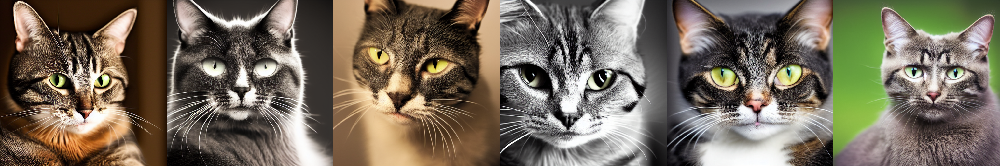

In [5]:
get_image(target_latents, 1, 6)

## Stochastic

In [6]:
prompt = ["a medieval painting of a cat"]

height = 512  # default height of Stable Diffusion
width = 512  # default width of Stable Diffusion
num_inference_steps = 200  # Number of denoising steps
guidance_scale = 7.5  # Scale for classifier-free guidance
generator = torch.cuda.manual_seed(999)  # Seed generator to create the initial latent noise
# batch_size = len(obj_prompt)
batch_size = 6

embeddings = get_text_embedding(prompt * batch_size)
uncond_embeddings = get_text_embedding([""] * batch_size)
latents = torch.randn(
    (batch_size, unet.config.in_channels, height // 8, width // 8),
    generator=generator,
    device=torch_device,
)
scheduler.set_timesteps(num_inference_steps)
latents = latents * scheduler.init_noise_sigma

In [7]:
T = 5e-4
logp = 5e2

ll_0 = (-0.5*(latents/scheduler.init_noise_sigma)**2).sum((1,2,3))
ll_obj = ll_0*torch.ones((num_inference_steps+1,batch_size), device=torch_device)
ll_bg = ll_0*torch.ones((num_inference_steps+1,batch_size), device=torch_device)
kappa = 0.5*torch.ones((num_inference_steps+1,batch_size), device=torch_device)
for i, t in enumerate(scheduler.timesteps):
  dsigma = scheduler.sigmas[i + 1] - scheduler.sigmas[i]
  sigma = scheduler.sigmas[i]
  vel_obj = (latents - target_latents)/(sigma+1.0)
  vel_bg, _ = get_vel(t, sigma, latents, [embeddings])
  vel_uncond, _ = get_vel(t, sigma, latents, [uncond_embeddings])
  
  kappa[i+1] = torch.softmax(torch.stack([T*(ll_obj[i]+logp), T*(ll_bg[i])]), 0)[0]

  vf = vel_uncond + guidance_scale*((vel_bg - vel_uncond) + kappa[i+1][:,None,None,None]*(vel_obj-vel_bg))
  dx = 2*dsigma*vf + torch.sqrt(2*torch.abs(dsigma)*sigma)*torch.randn_like(latents)
  latents += dx
  ll_obj[i+1] = ll_obj[i] - (vel_obj*(dx + dsigma*vel_obj)/sigma).sum((1,2,3))
  ll_bg[i+1] = ll_bg[i] - (vel_bg*(dx + dsigma*vel_bg)/sigma).sum((1,2,3))

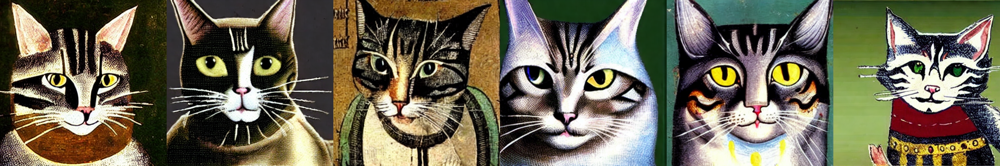

In [8]:
get_image(latents, 1, 6)

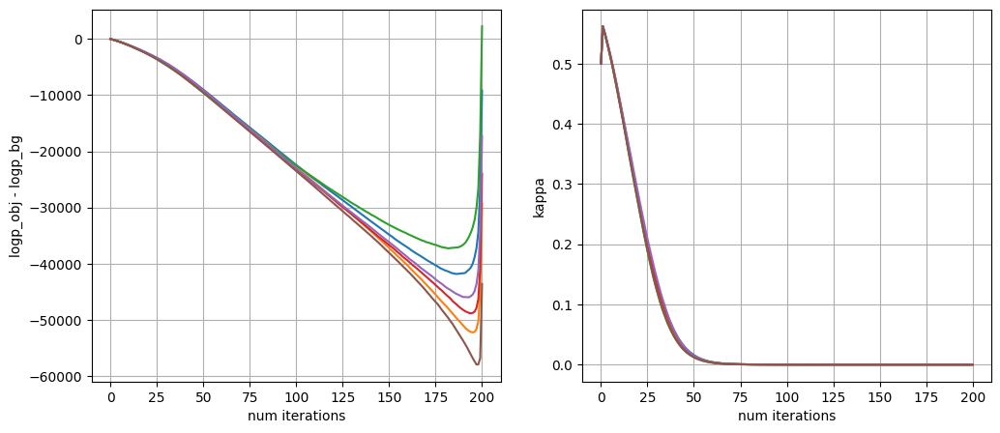

In [9]:
plt.figure(figsize=(12,5))
plt.subplot(121)
plt.plot((ll_obj-ll_bg).cpu().numpy())
plt.ylabel('logp_obj - logp_bg')
plt.xlabel('num iterations')
plt.grid()
plt.subplot(122)
plt.plot(kappa.cpu().numpy())
plt.ylabel('kappa')
plt.xlabel('num iterations')
plt.grid()

In [10]:
prompt = ["a cat from a pixar cartoon"]

height = 512  # default height of Stable Diffusion
width = 512  # default width of Stable Diffusion
num_inference_steps = 200  # Number of denoising steps
guidance_scale = 7.5  # Scale for classifier-free guidance
generator = torch.cuda.manual_seed(999)  # Seed generator to create the initial latent noise
# batch_size = len(obj_prompt)
batch_size = 6

embeddings = get_text_embedding(prompt * batch_size)
uncond_embeddings = get_text_embedding([""] * batch_size)
latents = torch.randn(
    (batch_size, unet.config.in_channels, height // 8, width // 8),
    generator=generator,
    device=torch_device,
)
scheduler.set_timesteps(num_inference_steps)
latents = latents * scheduler.init_noise_sigma

In [11]:
T = 5e-4
logp = 5e2

ll_0 = (-0.5*(latents/scheduler.init_noise_sigma)**2).sum((1,2,3))
ll_obj = ll_0*torch.ones((num_inference_steps+1,batch_size), device=torch_device)
ll_bg = ll_0*torch.ones((num_inference_steps+1,batch_size), device=torch_device)
kappa = 0.5*torch.ones((num_inference_steps+1,batch_size), device=torch_device)
for i, t in enumerate(scheduler.timesteps):
  dsigma = scheduler.sigmas[i + 1] - scheduler.sigmas[i]
  sigma = scheduler.sigmas[i]
  vel_obj = (latents - target_latents)/(sigma+1.0)
  vel_bg, _ = get_vel(t, sigma, latents, [embeddings])
  vel_uncond, _ = get_vel(t, sigma, latents, [uncond_embeddings])
  
  kappa[i+1] = torch.softmax(torch.stack([T*(ll_obj[i]+logp), T*(ll_bg[i])]), 0)[0]

  vf = vel_uncond + guidance_scale*((vel_bg - vel_uncond) + kappa[i+1][:,None,None,None]*(vel_obj-vel_bg))
  dx = 2*dsigma*vf + torch.sqrt(2*torch.abs(dsigma)*sigma)*torch.randn_like(latents)
  latents += dx
  ll_obj[i+1] = ll_obj[i] - (vel_obj*(dx + dsigma*vel_obj)/sigma).sum((1,2,3))
  ll_bg[i+1] = ll_bg[i] - (vel_bg*(dx + dsigma*vel_bg)/sigma).sum((1,2,3))

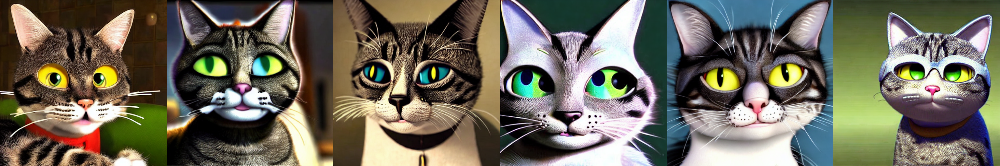

In [12]:
get_image(latents, 1, 6)